# Univariate Analysis

#### what is Univariate Analysis?
Univariate analysis is a statistical technique used to examine and understand one variable at a time.
Univariate analysis = Studying one feature independently to understand its distribution, pattern, and behavior.

#### Why Do We Perform Univariate Analysis?

#### What Do We Check in Univariate Analysis?
- For Numerical Variables : 
    Mean , Median,Standard deviation, Min & Max, Range,Skewness,outliers,Distribution shape (normal / skewed)
    Visual tools: Histogram, Boxplot

- For Categorical Variables

    Frequency counts, Percentage distribution,Most/least frequent category, Class imbalance (especially target variable)

Visual tools: Bar plot, Count plot


Univariate analysis is the process of analyzing each variable individually to understand its distribution, characteristics, and potential data issues. It does not examine relationships between variables. It is an essential step in Exploratory Data Analysis (EDA) and helps in identifying missing values, skewness, outliers, and class imbalance. In the Adult dataset, univariate analysis is performed on all 14 features to understand their individual behavior before proceeding to further analysis or model building.


#### Definition: Focuses on analyzing a single variable at a time.



#### Purpose: To understand the variable's distribution, central tendency, and spread.

####  we analyze a single variable, this method does not explore: Relationships, Interactions, Correlations and Causes
#### Why Univariate Analysis Is Important:
     it helps us understand:
     Distribution Shapes: Data Skewed or symmetric
     Central Tendency: Mean, Median, Mode
     Spread/ Variability: Range, IQR, Standard Deviation
     Outliers: Extreme values that need to be cleaned or transformed
     Class Imbalance(Categorical Variable) : Which category dominate or which category are rare?
     Data Quality: Missing Values, Invalid values, or unexpected patterns.     

#### Numerical Variable
     Techniques: Descriptive Statistics (Min, Max, Mean, Mode, Median, Range, Standard Deviation, Quantitles, skewness)
      
     Visualizations :  Histogram, Box plot, Density Plot
      
     Examples: age, hours_per_week
     
#### Categorical Variable
     Techniques: Frequency Count, Frequency Percentage 
     
     Visualizations : Pie Chart and Bar Chart
    
     Examples: workclass, marital_status, occupation, sex

#### Limitations:
####      1. Only One Variable at a Time
     
         Cannot detect multicollinearity

         Cannot detect interactions

####     2. No Context
        A variable may look normal alone but behave differently when combined with others.
        
      Example:

        Age distribution looks normal

        But age vs income may show a strong pattern

####    3. Not Enough for Decision‑Making
    
      You cannot make business or modeling decisions based only on univariate results.

      It must be combined with bivariate and multivariate analysis.

####    4. Limited for Categorical Variables
    
      Bar charts show frequency but not relationships.

      Rare categories may look harmless until you compare them with the target variable.

#### Advantages:
#### 1. Simple and Easy to Understand
     It is the most basic form of analysis.

     Requires minimal statistical knowledge.

     Easy to explain to non‑technical audiences.

#### 2. Fast and Computationally Lightweight

     Works on one variable at a time.

     No complex calculations or heavy processing.

#### 3. Helps Detect Data Quality Issues Early

      Missing values, Outliers, Invalid values, skewed distribution

#### 4. Guides Feature Engineering

     Skewed variables may need transformation (log, sqrt).

     Outliers may need capping or removal.

     Categorical variables may need grouping or encoding.

#### 5. Foundation for Deeper Analysis

     Before studying relationships, you must understand each variable individually.

     Sets the stage for bivariate and multivariate analysis.

#### Disadvantages:
#### 1. Cannot Explain Relationships

      It does not show how variables interact.

       You cannot answer questions like:
           “Does education affect income?”  
           “Does age influence hours worked?”

#### 2. No Insight Into Causes

      It is descriptive, not explanatory.

      You cannot infer why a pattern exists.

#### 3. Limited Usefulness for Predictive Modeling

      Models rely on relationships between variables.

      Univariate analysis alone cannot build or validate a model.

#### 4. Oversimplifies Complex Data

      Real‑world datasets have interactions, correlations, and dependencies.

      Looking at one variable at a time may hide important patterns.

### Conclusion: Univariate analysis examines a single variable at a time to understand its distribution, central tendency, spread, outliers, and data quality. Because it focuses on only one variable, it cannot reveal relationships, interactions, correlations, or causes, and must be followed by bivariate and multivariate analysis for deeper insights.




In [62]:
import pandas as pd          # Data manipulation
import numpy as np           # Numerical operations

import matplotlib.pyplot as plt   # Basic plotting
import seaborn as sns             # Statistical visualizations

import plotly.express as px       # Interactive plots (histograms, bar charts)

sns.set(style="whitegrid")

In [61]:
import warnings
warnings.filterwarnings("ignore")


In [4]:


df_train_test = pd.read_csv("df_train_test.csv") 

df_train_test.head()


,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,source,capital_gain_bin,capital_loss_bin,net_capital,income_binary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,train,1,0,2174,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,train,0,0,0,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,train,0,0,0,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,train,0,0,0,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,train,0,0,0,0


#  age
####  Variable Type:
####     Numerical (Continuous)


In [5]:
# Summary statistics

print(df_train_test['age'].describe())

# Mode
print("Mode of age:", df_train_test['age'].mode()[0])


count    48813.000000
mean        38.647348
std         13.709005
min         17.000000
25%         28.000000
50%         37.000000
75%         48.000000
max         90.000000
Name: age, dtype: float64
Mode of age: 36


#### The age distribution ranges from 17 to 90, covering a wide span of working‑age adults.

#### The average age is ~39, and the median is 37, showing a fairly balanced distribution.

#### The most common age is 36, indicating a concentration of individuals in their mid‑30s.

#### The spread (std = 13.7) shows diversity in age, with both younger and older adults represented.

#### No unrealistic values or anomalies are present.

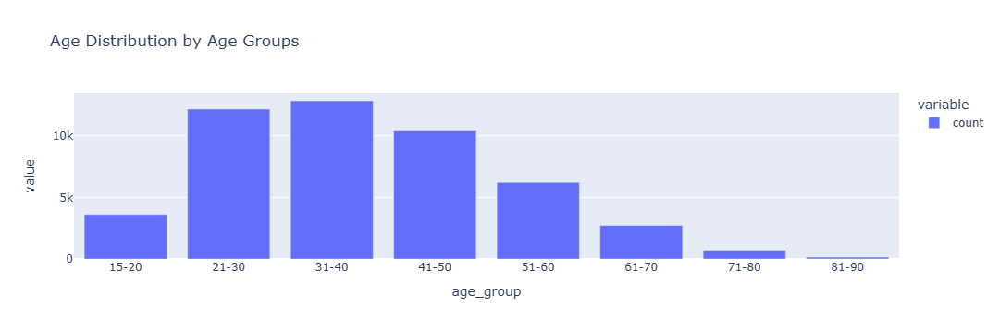

In [10]:
# Histogram
bins = [15, 20, 30, 40, 50, 60, 70, 80, 90]
labels = ['15-20','21-30','31-40','41-50','51-60','61-70','71-80','81-90']

df_train_test['age_group'] = pd.cut(df_train_test['age'], bins=bins, labels=labels, include_lowest=True)

fig = px.bar(
    df_train_test['age_group'].value_counts().sort_index(),
    title='Age Distribution by Age Groups'
)
fig.update_traces(hovertemplate='Age Group: %{x}<br>Count: %{y}')
fig.show()


#### The dataset is heavily concentrated in the 21–50 age range, with the highest representation in the 31–40 group. Both younger (15–20) and older (70+) age groups are underrepresented, indicating that the dataset primarily reflects working‑age adults.

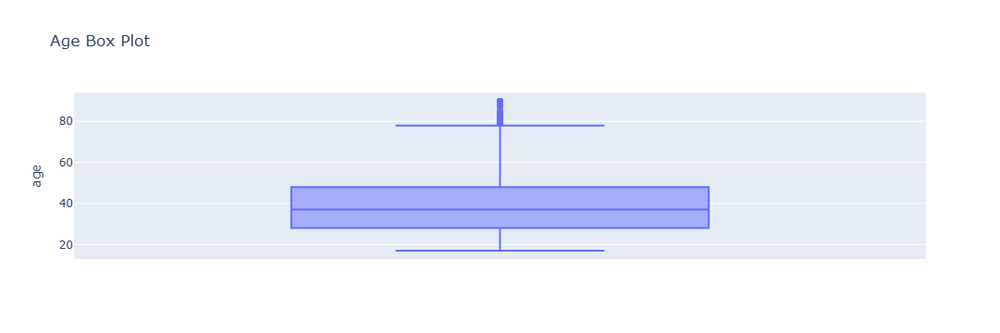

In [11]:
# Box plot
fig = px.box(df_train_test, y='age', title='Age Box Plot')
fig.show()


#### The age distribution is centered around 37 years, with most individuals between 28 and 48. The data shows a slight right skew due to older individuals (70–90), which appear as outliers. Overall, the distribution is clean, realistic, and consistent with a working‑age population.

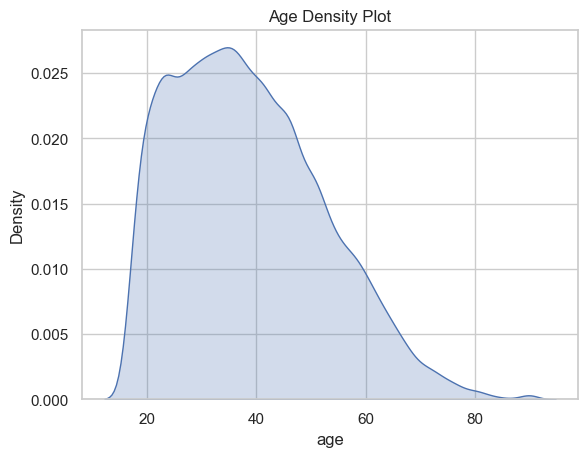

In [12]:
# Density plot
sns.kdeplot(df_train_test['age'], fill=True)
plt.title('Age Density Plot')
plt.show()


####  The age density plot shows a smooth, slightly right‑skewed distribution with the highest concentration of individuals between ages 30 and 40. Density declines steadily after age 50, with very few individuals above 70, indicating a typical working‑age population.

#### The age variable shows a clean, slightly right‑skewed distribution centered around the mid‑30s, with most individuals between 28 and 48, a mode of 36, and only a small number of older outliers.


# 2. Workclass 

####    Variable Type:
####       Categorical

In [13]:
# Descriptive summary for categorical variable
print("Unique categories:", df_train_test['workclass'].nunique())
print("\nCategory counts:\n", df_train_test['workclass'].value_counts())
print("\nCategory percentages:\n", df_train_test['workclass'].value_counts(normalize=True) * 100)
print("Mode of workclass:", df_train_test['workclass'].mode()[0])



Unique categories: 9

Category counts:
 workclass
Private             33879
Self-emp-not-inc     3861
Local-gov            3136
Unknown              2799
State-gov            1981
Self-emp-inc         1694
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: count, dtype: int64

Category percentages:
 workclass
Private             69.405691
Self-emp-not-inc     7.909778
Local-gov            6.424518
Unknown              5.734128
State-gov            4.058345
Self-emp-inc         3.470387
Federal-gov          2.933645
Without-pay          0.043021
Never-worked         0.020486
Name: proportion, dtype: float64
Mode of workclass: Private


#### The workclass variable is heavily skewed toward Private employment (69%), with government and self‑employment categories forming small secondary groups and two extremely rare categories (Without‑pay, Never‑worked) that contribute almost nothing to the dataset.

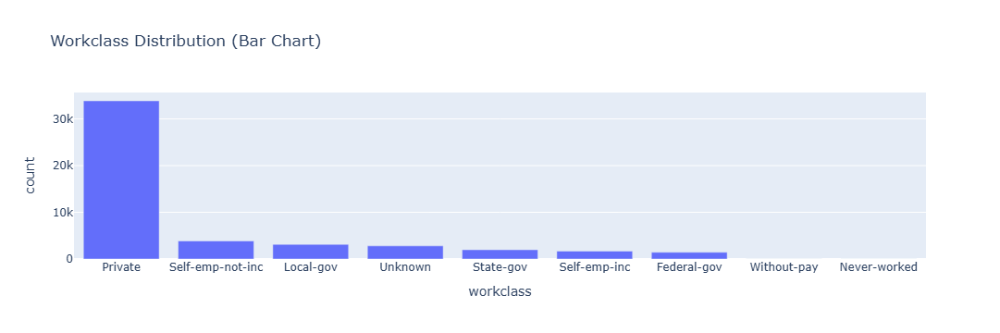

In [14]:
wc = df_train_test['workclass'].value_counts().reset_index()
wc.columns = ['workclass', 'count']

fig = px.bar(
    wc,
    x='workclass',
    y='count',
    title='Workclass Distribution (Bar Chart)'
)

fig.update_traces(hovertemplate='Workclass: %{x}<br>Count: %{y}')
fig.show()



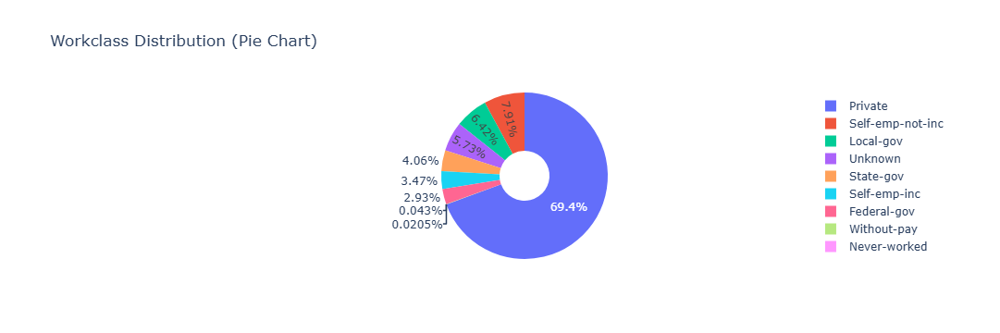

In [15]:
fig = px.pie(
    df_train_test,
    names='workclass',
    title='Workclass Distribution (Pie Chart)',
    hole=0.3  # optional donut style
)

fig.update_traces(hovertemplate='Workclass: %{label}<br>Percent: %{percent}')
fig.show()


In [16]:
df_train_test['workclass_grouped'] = df_train_test['workclass'].replace({
    'Federal-gov': 'Government',
    'State-gov': 'Government',
    'Local-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Self-emp-not-inc': 'Self-Employed',
    'Without-pay': 'Not-Working',
    'Never-worked': 'Not-Working',
    'Unknown': 'Unknown',
    'Private': 'Private'
})


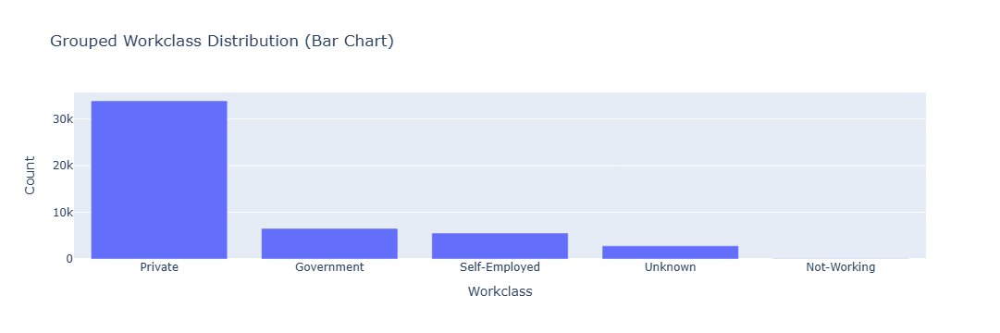

In [17]:
wc_grouped = df_train_test['workclass_grouped'].value_counts().reset_index()
wc_grouped.columns = ['workclass_grouped', 'count']

fig = px.bar(
    wc_grouped,
    x='workclass_grouped',
    y='count',
    title='Grouped Workclass Distribution (Bar Chart)',
    labels={'workclass_grouped': 'Workclass', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Workclass: %{x}<br>Count: %{y}')
fig.show()


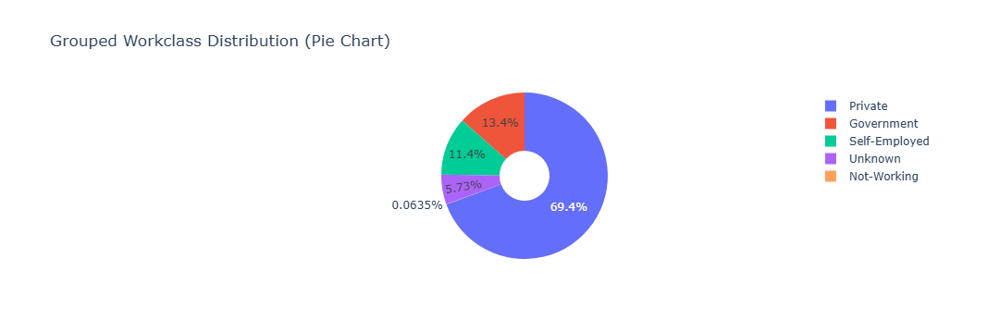

In [18]:
fig = px.pie(
    df_train_test,
    names='workclass_grouped',
    title='Grouped Workclass Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Workclass: %{label}<br>Percent: %{percent}')
fig.show()


#### The workclass is heavily dominated by Private‑sector workers, with Government and Self‑Employed forming mid‑sized groups, while Unknown and Not‑Working categories are very small and require careful handling in analysis and modeling.

# 3. fnlwgt
#### Variable Type:
  ####   Numeric(continuous)

In [19]:
print(df_train_test['fnlwgt'].describe())
print("Mode of fnlwgt:", df_train_test['fnlwgt'].mode()[0])


count    4.881300e+04
mean     1.896679e+05
std      1.056062e+05
min      1.228500e+04
25%      1.175550e+05
50%      1.781400e+05
75%      2.376200e+05
max      1.490400e+06
Name: fnlwgt, dtype: float64
Mode of fnlwgt: 203488


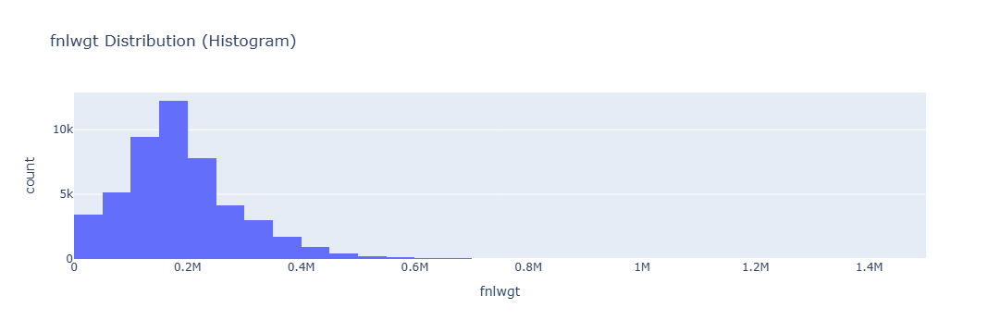

In [20]:
fig = px.histogram(
    df_train_test,
    x='fnlwgt',
    nbins=40,
    title='fnlwgt Distribution (Histogram)'
)
fig.update_traces(hovertemplate='fnlwgt: %{x}<br>Count: %{y}')
fig.show()


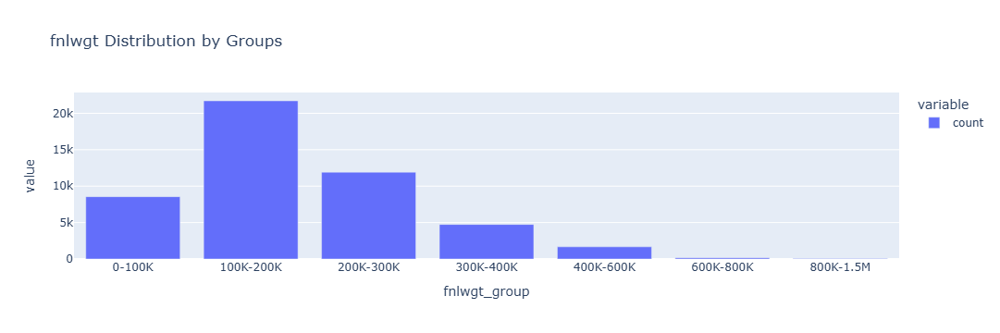

In [21]:
bins = [0, 100000, 200000, 300000, 400000, 600000, 800000, 1500000]
labels = [
    '0-100K', '100K-200K', '200K-300K', '300K-400K',
    '400K-600K', '600K-800K', '800K-1.5M'
]

df_train_test['fnlwgt_group'] = pd.cut(df_train_test['fnlwgt'], bins=bins, labels=labels, include_lowest=True)

fig = px.bar(
    df_train_test['fnlwgt_group'].value_counts().sort_index(),
    title='fnlwgt Distribution by Groups'
)
fig.update_traces(hovertemplate='Group: %{x}<br>Count: %{y}')
fig.show()


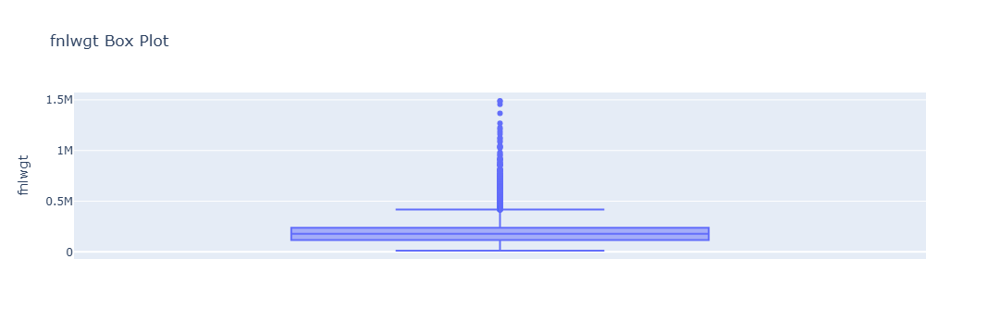

In [22]:
fig = px.box(
    df_train_test,
    y='fnlwgt',
    title='fnlwgt Box Plot'
)
fig.update_traces(hovertemplate='fnlwgt: %{y}')
fig.show()


#### The fnlwgt variable shows a strongly right‑skewed distribution, where most individuals fall within moderate weight ranges and a small portion carry exceptionally large sampling weights. The majority of values cluster between 100K and 300K, with frequencies dropping sharply as the weight increases. This pattern reveals substantial high‑end outliers and an uneven spread, suggesting that fnlwgt may need transformation, binning, or careful handling during modeling.

# 4. Education
#### Variable Type:
#### Categorical


In [23]:
print("Unique categories:", df_train_test['education'].nunique())
print("\nCategory counts:\n", df_train_test['education'].value_counts())
print("\nCategory percentages:\n", df_train_test['education'].value_counts(normalize=True) * 100)


Unique categories: 16

Category counts:
 education
HS-grad         15777
Some-college    10869
Bachelors        8020
Masters          2656
Assoc-voc        2060
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           954
Prof-school       834
9th               756
12th              656
Doctorate         594
5th-6th           508
1st-4th           245
Preschool          82
Name: count, dtype: int64

Category percentages:
 education
HS-grad         32.321308
Some-college    22.266609
Bachelors       16.430049
Masters          5.441173
Assoc-voc        4.220187
11th             3.712126
Assoc-acdm       3.279864
10th             2.845553
7th-8th          1.954397
Prof-school      1.708561
9th              1.548768
12th             1.343904
Doctorate        1.216889
5th-6th          1.040706
1st-4th          0.501915
Preschool        0.167988
Name: proportion, dtype: float64


In [24]:
print("Mode of education:", df_train_test['education'].mode()[0])


Mode of education: HS-grad


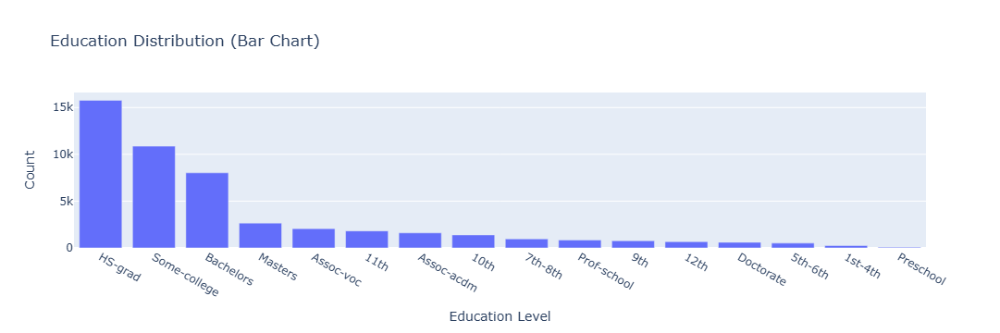

In [25]:
edu = df_train_test['education'].value_counts().reset_index()
edu.columns = ['education', 'count']

fig = px.bar(
    edu,
    x='education',
    y='count',
    title='Education Distribution (Bar Chart)',
    labels={'education': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


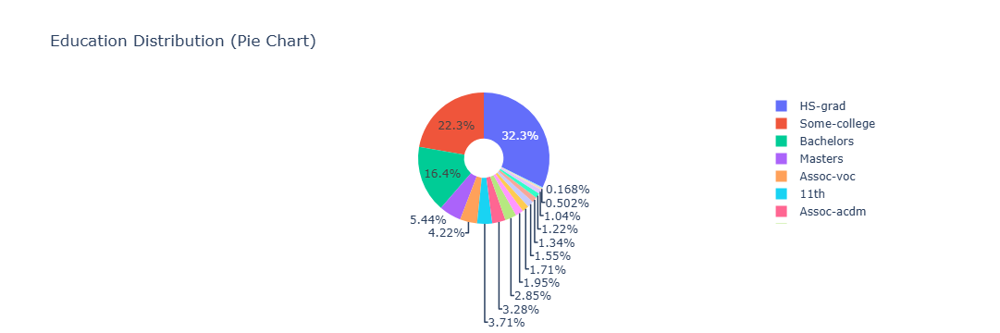

In [26]:
fig = px.pie(
    df_train_test,
    names='education',
    title='Education Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


In [27]:
df_train_test['education_grouped'] = df_train_test['education'].replace({
    'Preschool': 'Lower-Education',
    '1st-4th': 'Lower-Education',
    '5th-6th': 'Lower-Education',
    '7th-8th': 'Lower-Education',
    '9th': 'Lower-Education',
    '10th': 'Lower-Education',
    '11th': 'Lower-Education',
    '12th': 'Lower-Education',
    'HS-grad': 'High-School',
    'Some-college': 'Some-College',
    'Assoc-acdm': 'Associates',
    'Assoc-voc': 'Associates',
    'Bachelors': 'Bachelors',
    'Masters': 'Advanced-Degree',
    'Doctorate': 'Advanced-Degree',
    'Prof-school': 'Advanced-Degree'
})


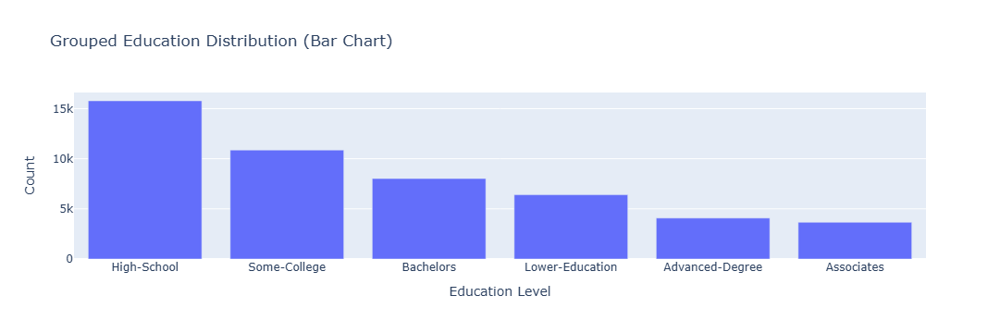

In [28]:
edu_grouped = df_train_test['education_grouped'].value_counts().reset_index()
edu_grouped.columns = ['education_grouped', 'count']

fig = px.bar(
    edu_grouped,
    x='education_grouped',
    y='count',
    title='Grouped Education Distribution (Bar Chart)',
    labels={'education_grouped': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


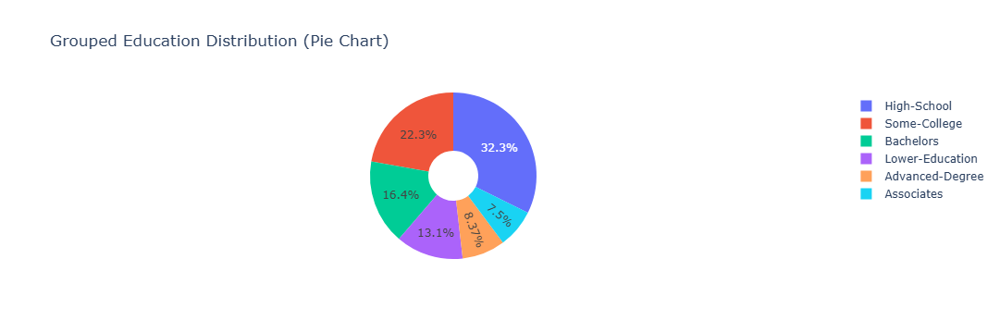

In [29]:
fig = px.pie(
    df_train_test,
    names='education_grouped',
    title='Grouped Education Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


#### The distribution of education levels shows that most individuals fall into mid‑level categories, with High‑School being the largest group, followed by Some‑College and Bachelors. Lower‑Education and Advanced‑Degree groups appear in moderate numbers, while Associates is the smallest category. This pattern reflects a population where basic and intermediate education levels dominate, and higher academic qualifications are comparatively less common.

#  5. Education_num
#### Variable Type:
#### ordinal

In [30]:
print(df_train_test['education_num'].describe())


count    48813.000000
mean        10.078688
std          2.570257
min          1.000000
25%          9.000000
50%         10.000000
75%         12.000000
max         16.000000
Name: education_num, dtype: float64


In [31]:
print("Mode of education_num:", df_train_test['education_num'].mode()[0])


Mode of education_num: 9


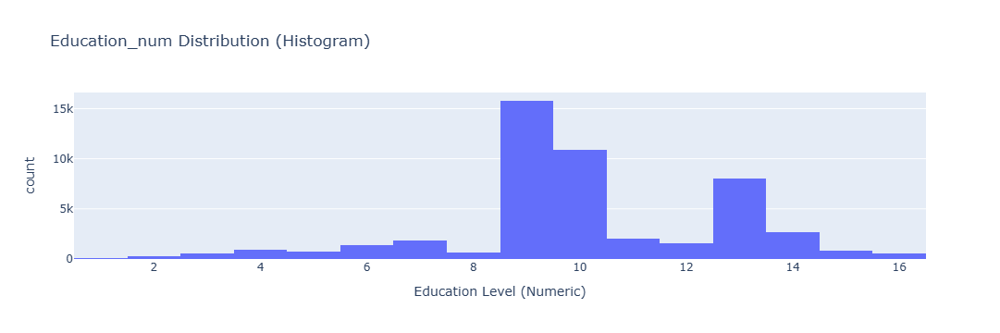

In [32]:
fig = px.histogram(
    df_train_test,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Histogram)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


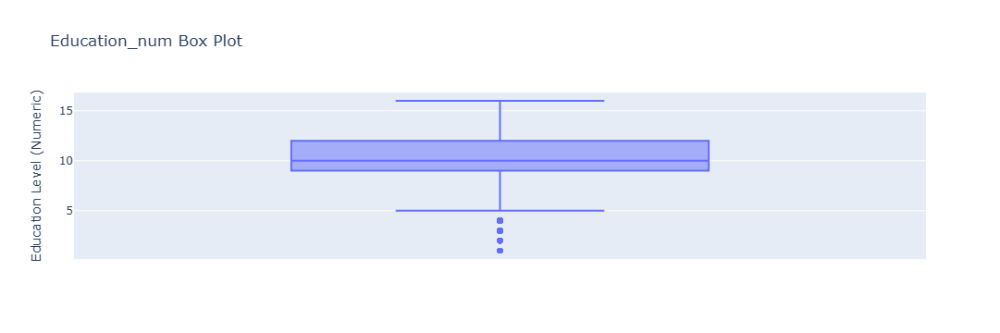

In [33]:
fig = px.box(
    df_train_test,
    y='education_num',
    title='Education_num Box Plot',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{y}')
fig.show()


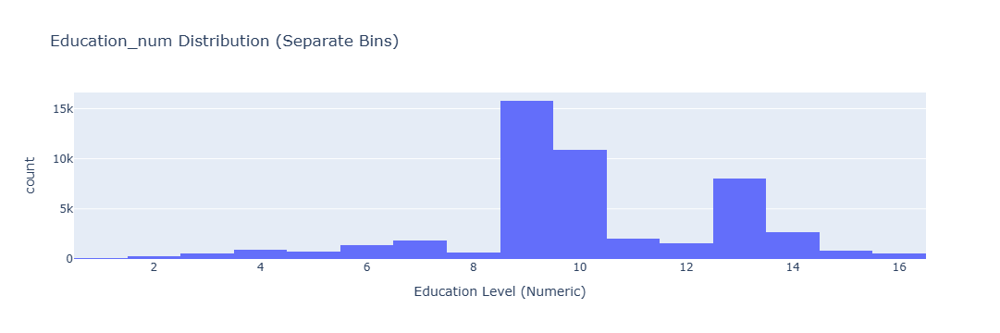

In [34]:
fig = px.histogram(
    df_train_test,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Separate Bins)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


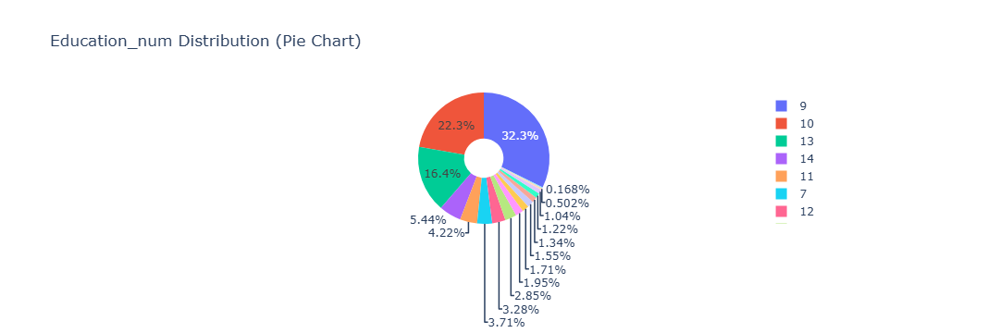

In [35]:
fig = px.pie(
    df_train_test,
    names='education_num',
    title='Education_num Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education_num: %{label}<br>Percent: %{percent}')
fig.show()


In [36]:
df_train_test['education_num_grouped'] = pd.cut(
    df_train_test['education_num'],
    bins=[0, 8, 9, 10, 12, 13, 16],
    labels=[
        'Lower-Education',   # 1–8
        'High-School',       # 9
        'Some-College',      # 10
        'Associates',        # 11–12
        'Bachelors',         # 13
        'Advanced-Degree'    # 14–16
    ],
    include_lowest=True
)


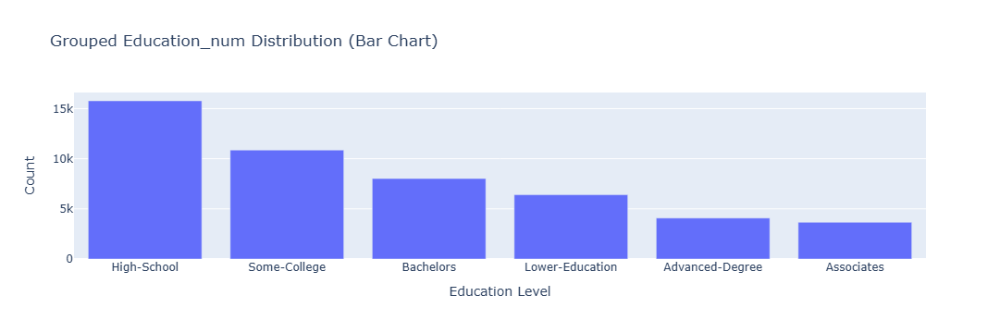

In [37]:
edu_grp = df_train_test['education_num_grouped'].value_counts().reset_index()
edu_grp.columns = ['education_grouped', 'count']

fig = px.bar(
    edu_grp,
    x='education_grouped',
    y='count',
    title='Grouped Education_num Distribution (Bar Chart)',
    labels={'education_grouped': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


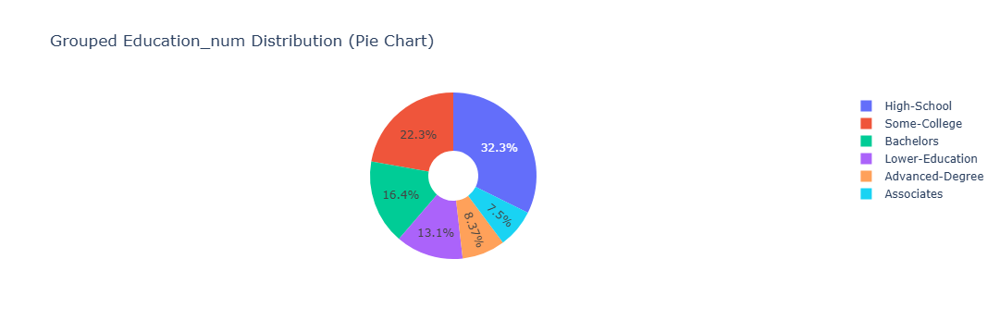

In [38]:
fig = px.pie(
    df_train_test,
    names='education_num_grouped',
    title='Grouped Education_num Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


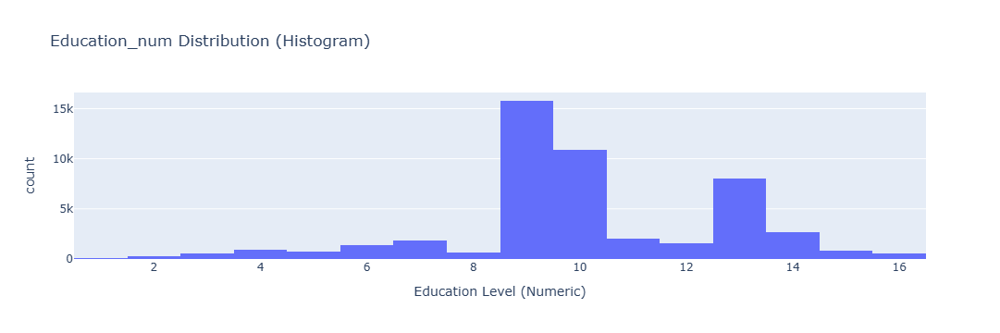

In [39]:
fig = px.histogram(
    df_train_test,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Histogram)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


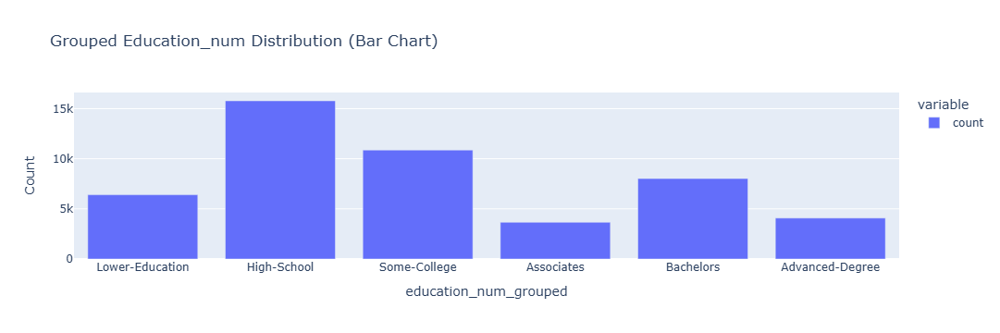

In [40]:
fig = px.bar(
    df_train_test['education_num_grouped'].value_counts().sort_index(),
    title='Grouped Education_num Distribution (Bar Chart)',
    labels={'index': 'Education Group', 'value': 'Count'}
)

fig.show()


#### The distribution of education levels shows that most individuals fall into mid‑level categories, with High‑School and Some‑College forming the largest portions of the population. Bachelors also represents a substantial share, while Lower‑Education and Advanced‑Degree groups appear in smaller but meaningful proportions. Associates is the least represented category, indicating that intermediate vocational or academic associate programs are less common in this dataset. Overall, the pattern reflects a population where basic and intermediate education levels dominate, and higher academic attainment is comparatively less frequent.

In [41]:
# Analysis of Capital_gain 

In [42]:
df_train_test['capital_gain'].describe()

count    48813.000000
mean      1079.708705
std       7454.185982
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      99999.000000
Name: capital_gain, dtype: float64

In [43]:
df_train_test['capital_gain'].skew()

np.float64(11.891093437953028)

<span style="color: blue;"><b> The distribution is heavily right‑skewed </b></span>

In [45]:
# Percentage of zero values (important for gain & loss)
zero_percent = (df_train_test['capital_gain'] == 0).mean() * 100
print(f" % of capital_gain zero values: {zero_percent:.2f}%")

 % of capital_gain zero values: 91.73%


In [46]:
(df_train_test['capital_gain'] == 0).mean()   # proportion of zeros

np.float64(0.9173375944932702)

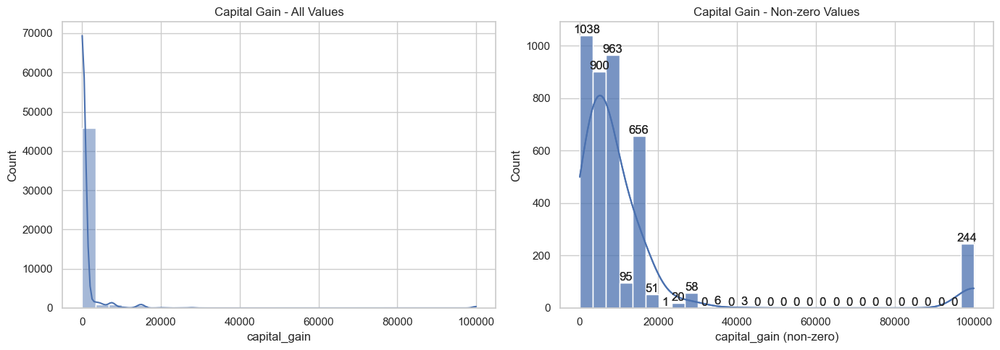

In [47]:
# 2 histogram one for all data and another for non-zero data

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 1) All data
sns.histplot(df_train_test['capital_gain'], bins=30, kde=True, ax=axes[0], color='#4c72b0')
axes[0].set_title('Capital Gain - All Values')
axes[0].set_xlabel('capital_gain')
axes[0].set_ylabel('Count')

# 2) Non-zero capital gain
non_zero_gain = df_train_test[df_train_test['capital_gain'] > 0]['capital_gain']
ax = sns.histplot(non_zero_gain, bins=30, kde=True, ax=axes[1], color='#4c72b0')
sns.histplot(non_zero_gain, bins=30, kde=True, ax=axes[1])
axes[1].set_title('Capital Gain - Non-zero Values')
axes[1].set_xlabel('capital_gain (non-zero)')
axes[1].set_ylabel('Count')

# Add counts on top of each bar
for container in ax.containers:
    ax.bar_label(container)          # or ax.bar_label(container, fmt='%d')
    
plt.tight_layout()
plt.show()

<span style="color: blue;"><b> Capital gains are zero for the majority of individuals.
Among positive capital gains, amounts are dispersed with a few very large values, indicating an extremely right‑skewed distribution.</b></span>

# Analysis of capital loss

In [49]:
df_train_test['capital_loss'].describe()

count    48813.000000
mean        87.554299
std        403.118605
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4356.000000
Name: capital_loss, dtype: float64

In [50]:
df_train_test['capital_loss'].skew()

np.float64(4.5682632007783495)

In [51]:
# Percentage of zero values (important for gain & loss)
zero_percent = (df_train_test['capital_loss'] == 0).mean() * 100
print(f" % of capital_loss zero values: {zero_percent:.2f}%")

 % of capital_loss zero values: 95.33%


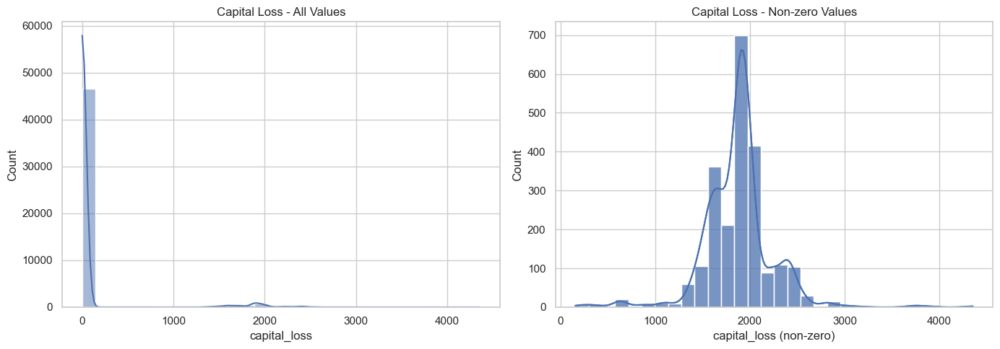

In [52]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# All values
sns.histplot(df_train_test['capital_loss'], bins=30, kde=True, ax=axes[0], color='#4c72b0')
axes[0].set_title('Capital Loss - All Values')
axes[0].set_xlabel('capital_loss')
axes[0].set_ylabel('Count')

# Non‑zero values
non_zero_gain = df_train_test[df_train_test['capital_loss'] > 0]['capital_loss']
ax = sns.histplot(non_zero_gain, bins=30, kde=True, ax=axes[1], color='#4c72b0')
sns.histplot(non_zero_gain, bins=30, kde=True, ax=axes[1])
axes[1].set_title('Capital Loss - Non-zero Values')
axes[1].set_xlabel('capital_loss (non-zero)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

<span style="color: blue;"><b> Capital loss is zero for 95.33% of individuals, Positive losses show a right-skewed distribution with peak around 2000 and a maximum of 4356, though much less extreme than capital gains.</b></span>

# Hours Per week Analysis

In [53]:
df_train_test['hours_per_week'].describe()

count    48813.000000
mean        40.425051
std         12.390954
min          1.000000
25%         40.000000
50%         40.000000
75%         45.000000
max         99.000000
Name: hours_per_week, dtype: float64

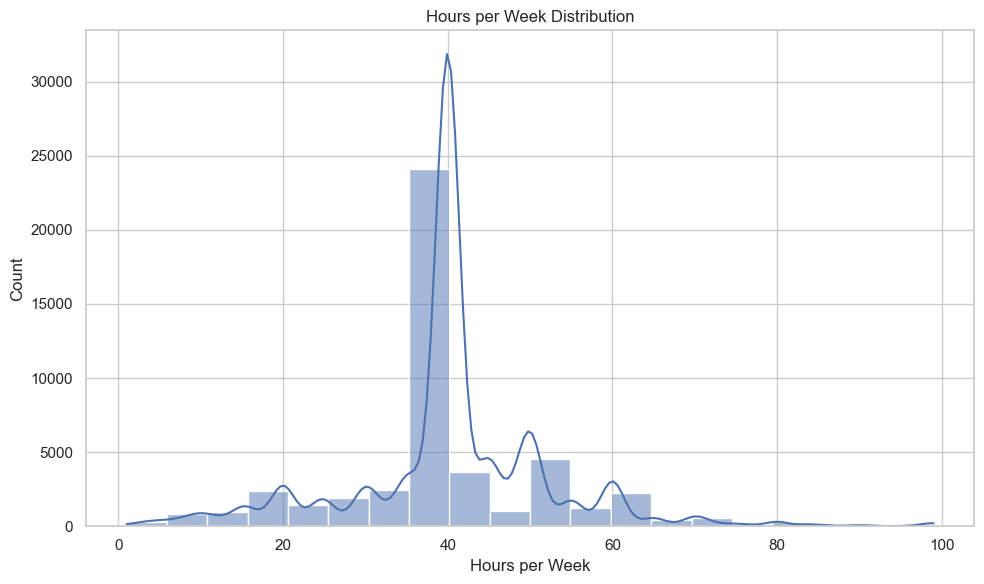

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))  # Single subplot

# Full distribution
sns.histplot(df_train_test['hours_per_week'], bins=20,  kde=True, color='#4c72b0', ax=ax)
ax.set_title('Hours per Week Distribution')
ax.set_xlabel('Hours per Week')
ax.set_ylabel('Count')

plt.tight_layout()
plt.show()


<span style="color: blue;">
Distribution centers tightly around standard 40-hour workweek (mean 40.4, median 40), with a peak at exactly 40 hours.
</span>
<span style="color: blue;">Clear right skew shows most work full-time hours, with smaller tails of part-time (<30) and overtime (>60) workers.</span>

# Native Country Analysis

In [55]:
# Cell 1: Basic exploration
print("Unique countries:", df_train_test['native_country'].nunique())
print("\nTop 10 countries:")
print(df_train_test['native_country'].value_counts().head(10))

Unique countries: 42

Top 10 countries:
native_country
United-States    43810
Mexico             947
Unknown            856
Philippines        295
Germany            206
Puerto-Rico        184
Canada             182
El-Salvador        155
India              151
Cuba               138
Name: count, dtype: int64


In [56]:
# Frequency table
country_counts = df_train_test['native_country'].value_counts()

print("Frequency Distribution:")
print(country_counts)

Frequency Distribution:
native_country
United-States                 43810
Mexico                          947
Unknown                         856
Philippines                     295
Germany                         206
Puerto-Rico                     184
Canada                          182
El-Salvador                     155
India                           151
Cuba                            138
England                         127
China                           122
South                           115
Jamaica                         106
Italy                           105
Dominican-Republic              103
Japan                            92
Poland                           87
Vietnam                          86
Guatemala                        86
Columbia                         85
Haiti                            75
Portugal                         67
Taiwan                           65
Iran                             59
Greece                           49
Nicaragua                

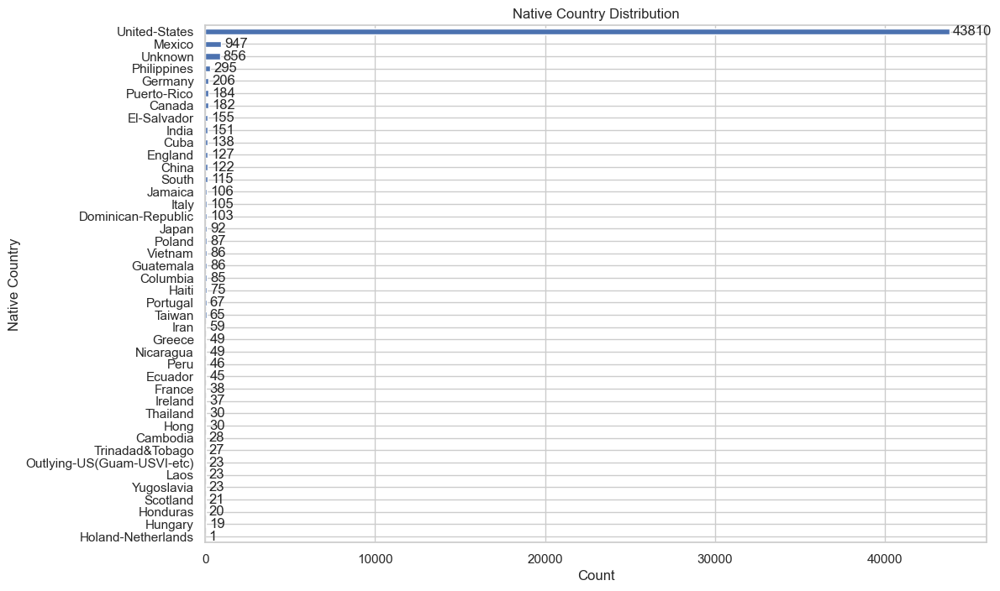

In [57]:
plt.figure(figsize=(12,8))

ax = country_counts.plot(kind='barh')

plt.title("Native Country Distribution")
plt.xlabel("Count")
plt.ylabel("Native Country")

plt.gca().invert_yaxis()  # Highest values at top

# Add value labels correctly
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)
plt.show()

<span style="color: blue;">The native_country variable is highly imbalanced, with the majority of individuals originating from the United-States, while other countries have very low representation.</span>

# Target Variable : Income Analysis

In [58]:
# Frequency count
income_counts = df_train_test['income'].value_counts()

print("Frequency Distribution:")
print(income_counts)

Frequency Distribution:
income
<=50K    37128
>50K     11685
Name: count, dtype: int64


In [59]:
income_percent = df_train_test['income'].value_counts(normalize=True) * 100

print("Percentage Distribution:")
print(income_percent.round(2))

Percentage Distribution:
income
<=50K    76.06
>50K     23.94
Name: proportion, dtype: float64


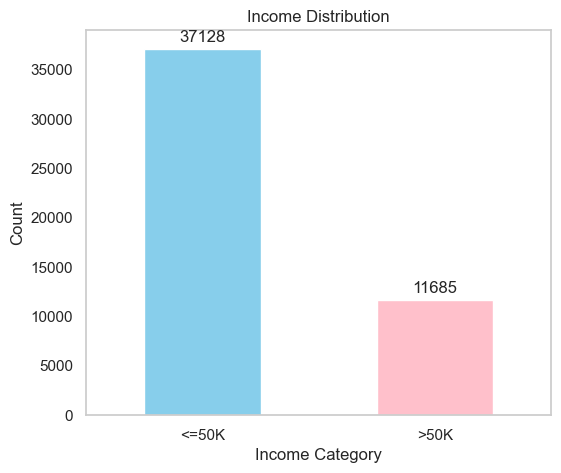

In [60]:

plt.figure(figsize=(6,5))

ax = income_counts.plot(kind='bar', color=['skyblue','pink'])

plt.title("Income Distribution")
plt.xlabel("Income Category")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.grid(False)

# Add labels on top
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

plt.show()

<span style="color: blue;">The income variable is imbalanced, with approximately 37,000 individuals earning ≤50K and around 11,700 earning >50K, showing a clear majority in the lower income category.</span>

### Distribution of Marital Status

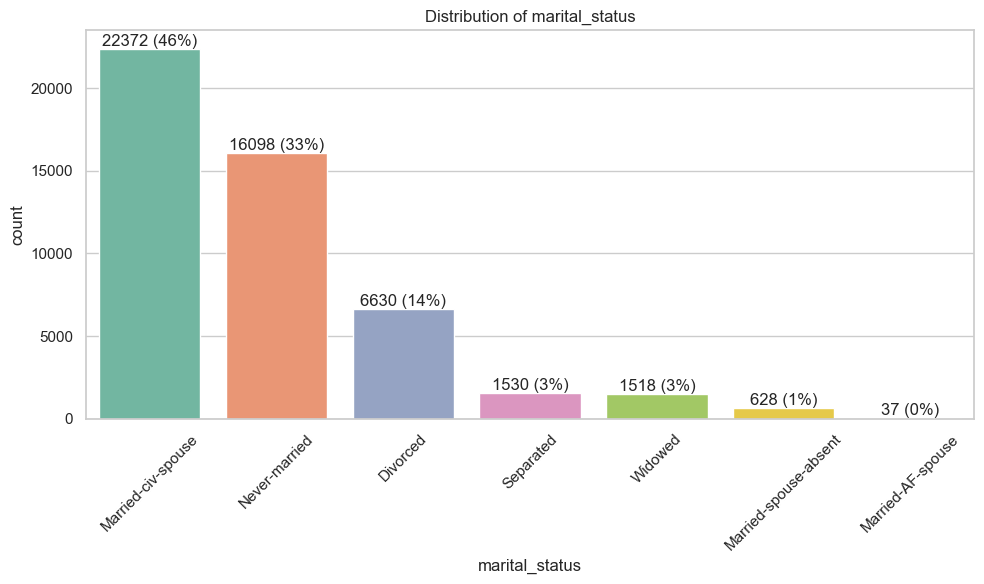

In [67]:
col = "marital_status"

plt.figure(figsize=(10,6))
ax = sns.countplot(data=df_train_test, x=col, order=df_train_test[col].value_counts().index, palette="Set2")
plt.title("Distribution of marital_status")
plt.xticks(rotation=45)

total = len(df_train_test[col])

# Add count + percentage labels
for p in ax.patches:
    count = int(p.get_height())
    percent = (count / total) * 100
    ax.annotate(
        f'{count} ({percent:.0f}%)',
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha='center', va='bottom'
    )

plt.tight_layout()
plt.show()


### Distribution of Occupation

occupation
Prof-specialty       6167
Craft-repair         6107
Exec-managerial      6084
Adm-clerical         5608
Sales                5504
Other-service        4919
Machine-op-inspct    3019
Unknown              2809
Transport-moving     2355
Handlers-cleaners    2071
Farming-fishing      1487
Tech-support         1445
Protective-serv       983
Priv-house-serv       240
Armed-Forces           15
Name: count, dtype: int64

Proportions:
occupation
Prof-specialty       0.126339
Craft-repair         0.125110
Exec-managerial      0.124639
Adm-clerical         0.114887
Sales                0.112757
Other-service        0.100772
Machine-op-inspct    0.061848
Unknown              0.057546
Transport-moving     0.048245
Handlers-cleaners    0.042427
Farming-fishing      0.030463
Tech-support         0.029603
Protective-serv      0.020138
Priv-house-serv      0.004917
Armed-Forces         0.000307
Name: proportion, dtype: float64


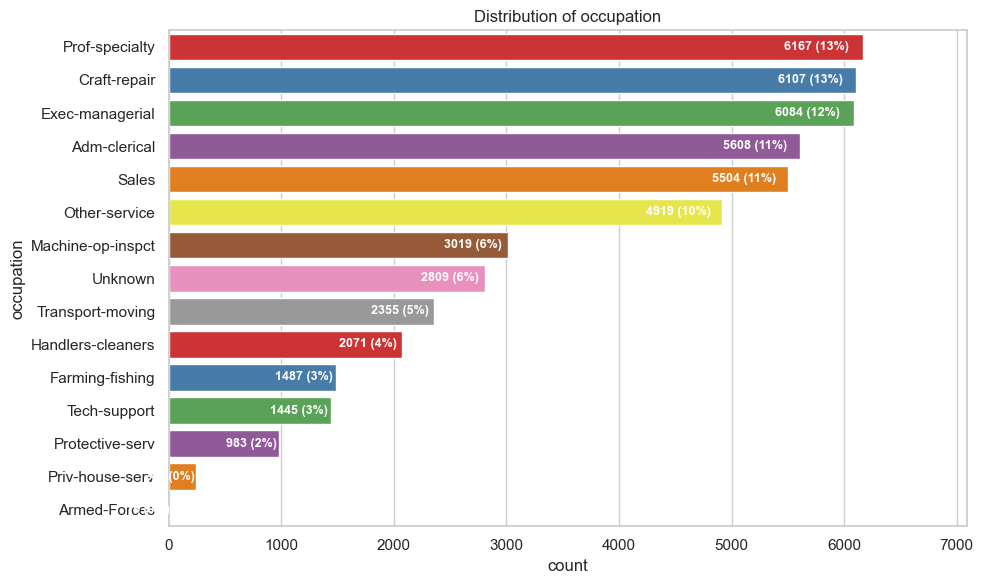

In [68]:
col = "occupation"

# Frequency tables
counts = df_train_test[col].value_counts()
print(counts)
print("\nProportions:")
print(df_train_test[col].value_counts(normalize=True))

plt.figure(figsize=(10,6))
ax = sns.countplot(
    data=df_train_test,
    y=col,
    order=counts.index,
    palette="Set1"
)
plt.title("Distribution of occupation")

total = len(df_train_test[col])
max_count = counts.max()

# Expand x‑axis so labels fit comfortably
plt.xlim(0, max_count * 1.15)

# Add count + percentage labels INSIDE the bar
for p in ax.patches:
    count = int(p.get_width())
    percent = (count / total) * 100

    # Position text slightly before the end of the bar
    ax.annotate(
        f'{count} ({percent:.0f}%)',
        (count * 0.98, p.get_y() + p.get_height() / 2),
        ha='right', va='center', color='white', fontsize=9, fontweight='bold'
    )

plt.tight_layout()
plt.show()

sex
Male      32631
Female    16182
Name: count, dtype: int64

Proportions:
sex
Male      0.66849
Female    0.33151
Name: proportion, dtype: float64


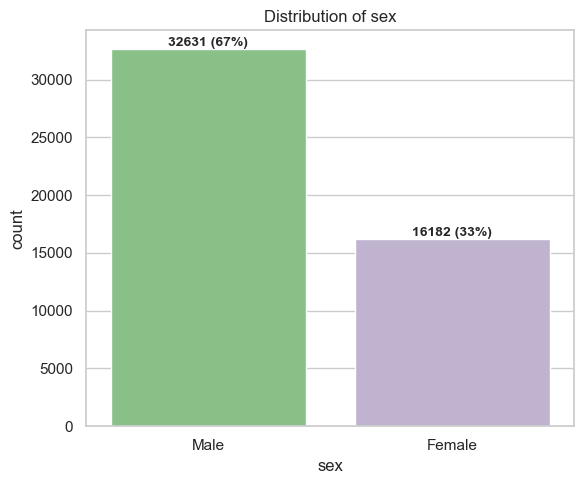

In [69]:
col = "sex"

counts = df_train_test[col].value_counts()
total = len(df_train_test[col])

print(counts)
print("\nProportions:")
print(df_train_test[col].value_counts(normalize=True))

plt.figure(figsize=(6,5))
ax = sns.countplot(
    data=df_train_test,
    x=col,
    order=counts.index,
    palette="Accent"
)
plt.title("Distribution of sex")

# Add count + percentage labels above bars
for p in ax.patches:
    count = int(p.get_height())
    percent = (count / total) * 100

    ax.annotate(
        f'{count} ({percent:.0f}%)',
        (p.get_x() + p.get_width() / 2, count),
        ha='center', va='bottom',
        fontsize=10, fontweight='bold'
    )

plt.tight_layout()
plt.show()


relationship
Husband           19709
Not-in-family     12567
Own-child          7576
Unmarried          5124
Wife               2331
Other-relative     1506
Name: count, dtype: int64

Proportions:
relationship
Husband           0.403765
Not-in-family     0.257452
Own-child         0.155205
Unmarried         0.104972
Wife              0.047754
Other-relative    0.030852
Name: proportion, dtype: float64


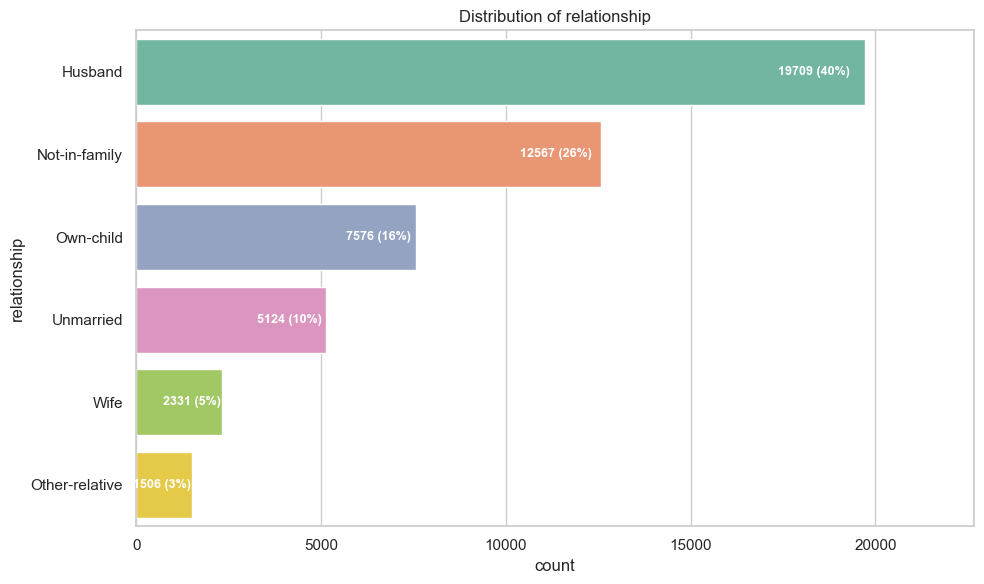

In [70]:
col = "relationship"

counts = df_train_test[col].value_counts()
total = len(df_train_test[col])
max_count = counts.max()

print(counts)
print("\nProportions:")
print(df_train_test[col].value_counts(normalize=True))

plt.figure(figsize=(10,6))
ax = sns.countplot(
    data=df_train_test,
    y=col,
    order=counts.index,
    palette="Set2"   # adds color
)
plt.title("Distribution of relationship")

# Expand x‑axis so labels fit
plt.xlim(0, max_count * 1.15)

# Add count + percentage labels INSIDE the bars
for p in ax.patches:
    count = int(p.get_width())
    percent = (count / total) * 100

    ax.annotate(
        f'{count} ({percent:.0f}%)',
        (count * 0.98, p.get_y() + p.get_height() / 2),
        ha='right', va='center',
        color='white', fontsize=9, fontweight='bold'
    )

plt.tight_layout()
plt.show()


race
White                 41736
Black                  4683
Asian-Pac-Islander     1518
Amer-Indian-Eskimo      470
Other                   406
Name: count, dtype: int64

Proportions:
race
White                 0.855018
Black                 0.095938
Asian-Pac-Islander    0.031098
Amer-Indian-Eskimo    0.009629
Other                 0.008317
Name: proportion, dtype: float64


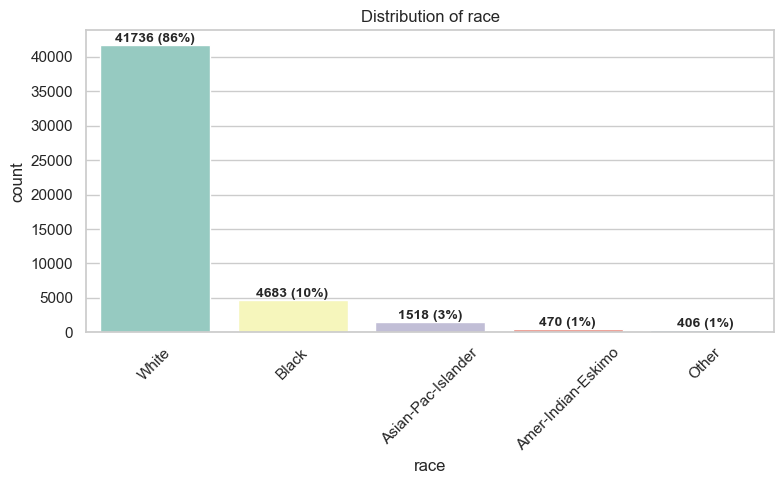

In [71]:
col = "race"

counts = df_train_test[col].value_counts()
total = len(df_train_test[col])

print(counts)
print("\nProportions:")
print(df_train_test[col].value_counts(normalize=True))

plt.figure(figsize=(8,5))
ax = sns.countplot(
    data=df_train_test,
    x=col,
    order=counts.index,
    palette="Set3"   #  color palette
)
plt.title("Distribution of race")
plt.xticks(rotation=45)

# Add count + percentage labels above bars
for p in ax.patches:
    count = int(p.get_height())
    percent = (count / total) * 100

    ax.annotate(
        f'{count} ({percent:.0f}%)',
        (p.get_x() + p.get_width() / 2, count),
        ha='center', va='bottom',
        fontsize=10, fontweight='bold'
    )

plt.tight_layout()
plt.show()

The dataset shows distinct patterns across key features:  
- 'Age':  Most individuals fall in the working‑age range, with age concentrated around the mid‑30s and gradually declining in higher ages.

- Workclass: Most individuals belong to the private sector, with all other workclass categories making up only small portions of the population.

- Fnlwgt: The fnlwgt variable is heavily right‑skewed, with most values in the mid‑range and a small number of extremely large weights creating significant high‑end outliers.

- Education: Most individuals fall into mid‑level education categories, with High‑School being the most common and Associates the least represented.

- Education_num: Most individuals fall into mid‑level education categories, with High‑School being the most common and Associates the least frequent.
- `native_country` is highly imbalanced, dominated by individuals from the United-States, with many rare countries representing less than 1% each.  
- The `income` variable is moderately imbalanced, with about 76% earning ≤50K and 24% earning >50K.  
- Numerical variables `capital_gain` and `capital_loss` are heavily right-skewed with most values at zero, indicating many individuals report no capital gains or losses.  
- `hours_per_week` centers around 40 hours with a roughly symmetric distribution, reflecting typical full-time work hours.